In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [2]:
!kaggle datasets download -d paramaggarwal/fashion-product-images-dataset

100% 23.1G/23.1G [02:40<00:00, 49.3MB/s]
100% 23.1G/23.1G [02:40<00:00, 155MB/s] 


In [3]:
import zipfile
zip_ref = zipfile.ZipFile('fashion-product-images-dataset.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [4]:
!pip install --upgrade tensorflow==2.3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.5/320.5 MB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 59.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 81.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 459.0/459.0 KB 45.0 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: gast
    Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Successfully uninstalled gast-0.4.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
   

In [23]:
# imports
import pickle
import tensorflow
import numpy as np
from numpy.linalg import norm
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from sklearn.neighbors import NearestNeighbors
import os

In [6]:
# import model ResNet with imagenet weights having standard size (224,224,3)
model = ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))

94773248/94765736 [==============================] - 1s 0us/step


In [7]:
model.trainable = False

In [8]:
# Removed last top layer of CNN and added our own layer named GloablMaxPooling2D
model = tensorflow.keras.Sequential([
    model,
    GlobalMaxPooling2D()
])

In [9]:
# SUMMARY OF MODEL
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_max_pooling2d (Global (None, 2048)              0         
Total params: 23,587,712
Trainable params: 0
Non-trainable params: 23,587,712
_________________________________________________________________
None


In [11]:
# LOAD IMAGE
img = image.load_img('/content/fashion-dataset/fashion-dataset/images/10012.jpg',target_size=(224,224))

In [13]:
img_array = image.img_to_array(img)
img_array.shape

(224, 224, 3)

In [14]:
expanded_img_array = np.expand_dims(img_array, axis=0)

In [15]:
expanded_img_array.shape

(1, 224, 224, 3)

In [16]:
preprocessed_img = preprocess_input(expanded_img_array)

In [17]:
print(preprocessed_img.shape)
preprocessed_img

(1, 224, 224, 3)


array([[[[151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         ...,
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ]],

        [[151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         ...,
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ]],

        [[151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         ...,
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ]],

        ...,

        [[151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         [151.061  , 138.22101, 131.32   ],
         ...,


In [19]:
model.predict(preprocessed_img).shape

(1, 2048)

In [20]:
result = model.predict(preprocessed_img).flatten()

In [21]:
normalized_result = result / norm(result)

In [22]:
## FEATURE EXTRACT FUNCTION
def feature_extraction(img_path,model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    result = model.predict(preprocessed_img).flatten()
    normalized_result = result / norm(result)

    return normalized_result

In [26]:
print(os.listdir('/content/fashion-dataset/fashion-dataset/images'))

['16169.jpg', '11191.jpg', '18806.jpg', '59060.jpg', '3260.jpg', '9001.jpg', '56929.jpg', '13472.jpg', '43390.jpg', '14855.jpg', '5146.jpg', '39628.jpg', '21665.jpg', '43848.jpg', '54987.jpg', '48064.jpg', '16521.jpg', '23723.jpg', '43011.jpg', '42091.jpg', '53475.jpg', '45848.jpg', '48360.jpg', '36792.jpg', '27581.jpg', '13685.jpg', '52398.jpg', '36802.jpg', '22837.jpg', '51323.jpg', '38127.jpg', '15306.jpg', '23247.jpg', '25606.jpg', '45996.jpg', '51726.jpg', '12255.jpg', '52314.jpg', '7421.jpg', '24363.jpg', '39157.jpg', '29127.jpg', '22807.jpg', '36978.jpg', '49861.jpg', '24326.jpg', '49954.jpg', '30738.jpg', '50473.jpg', '47645.jpg', '56541.jpg', '20139.jpg', '16103.jpg', '14786.jpg', '20249.jpg', '13933.jpg', '20792.jpg', '30550.jpg', '19083.jpg', '30597.jpg', '10156.jpg', '55569.jpg', '18856.jpg', '7049.jpg', '15546.jpg', '23270.jpg', '37537.jpg', '8257.jpg', '10226.jpg', '19844.jpg', '51801.jpg', '47206.jpg', '19453.jpg', '14851.jpg', '29150.jpg', '33342.jpg', '28930.jpg', '700

In [27]:
fileName = []

for file in os.listdir('/content/fashion-dataset/fashion-dataset/images'):
  fileName.append(os.path.join('/content/fashion-dataset/fashion-dataset/images',file))

In [29]:
print(fileName[1:5])
len(fileName)


['/content/fashion-dataset/fashion-dataset/images/11191.jpg', '/content/fashion-dataset/fashion-dataset/images/18806.jpg', '/content/fashion-dataset/fashion-dataset/images/59060.jpg', '/content/fashion-dataset/fashion-dataset/images/3260.jpg']


44441

In [30]:
featureList = []
for file in fileName:
  featureList.append(feature_extraction(file,model))

In [34]:
pickle.dump(featureList,open('embeddings.pkl','wb'))
pickle.dump(fileName,open('filenames.pkl','wb'))

In [35]:
np.array(featureList).shape

(44441, 2048)

## TESTING MODEL

In [37]:
feature_list = np.array(pickle.load(open('embeddings.pkl','rb')))
filenames = pickle.load(open('filenames.pkl','rb'))

In [38]:
feature_list.shape

(44441, 2048)

In [39]:
img1 = image.load_img('/content/fashion-dataset/fashion-dataset/images/10012.jpg', target_size=(224, 224))
img_array1 = image.img_to_array(img)
expanded_img_array1 = np.expand_dims(img_array, axis=0)
preprocessed_img1 = preprocess_input(expanded_img_array)
result1 = model.predict(preprocessed_img).flatten()
normalized_result1 = result / norm(result)

In [40]:
neighbors = NearestNeighbors(n_neighbors=6,algorithm='brute',metric='euclidean')
neighbors.fit(feature_list)
distances,indices = neighbors.kneighbors([normalized_result])

In [41]:
print(indices)

[[ 7388  5770 21027 19195 29362 42061]]


In [42]:
for i in indices[0]:
  print(filenames[i])

/content/fashion-dataset/fashion-dataset/images/10012.jpg
/content/fashion-dataset/fashion-dataset/images/7549.jpg
/content/fashion-dataset/fashion-dataset/images/7511.jpg
/content/fashion-dataset/fashion-dataset/images/9967.jpg
/content/fashion-dataset/fashion-dataset/images/15622.jpg
/content/fashion-dataset/fashion-dataset/images/6519.jpg


In [43]:
## import CV2
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [44]:
import cv2

In [46]:
from google.colab.patches import cv2_imshow

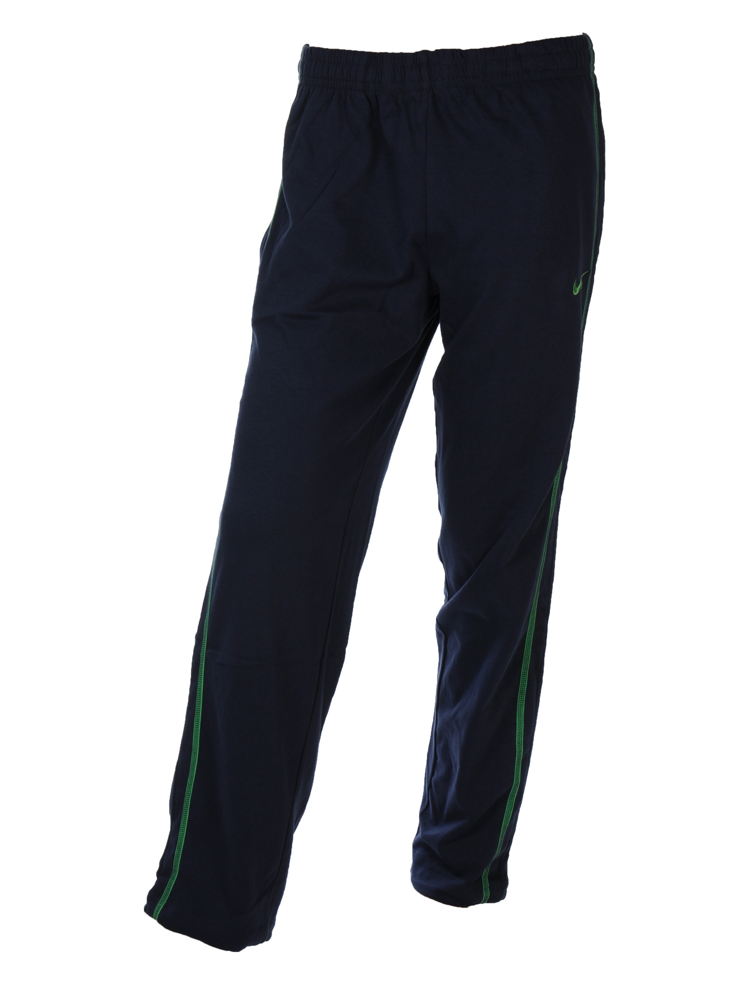

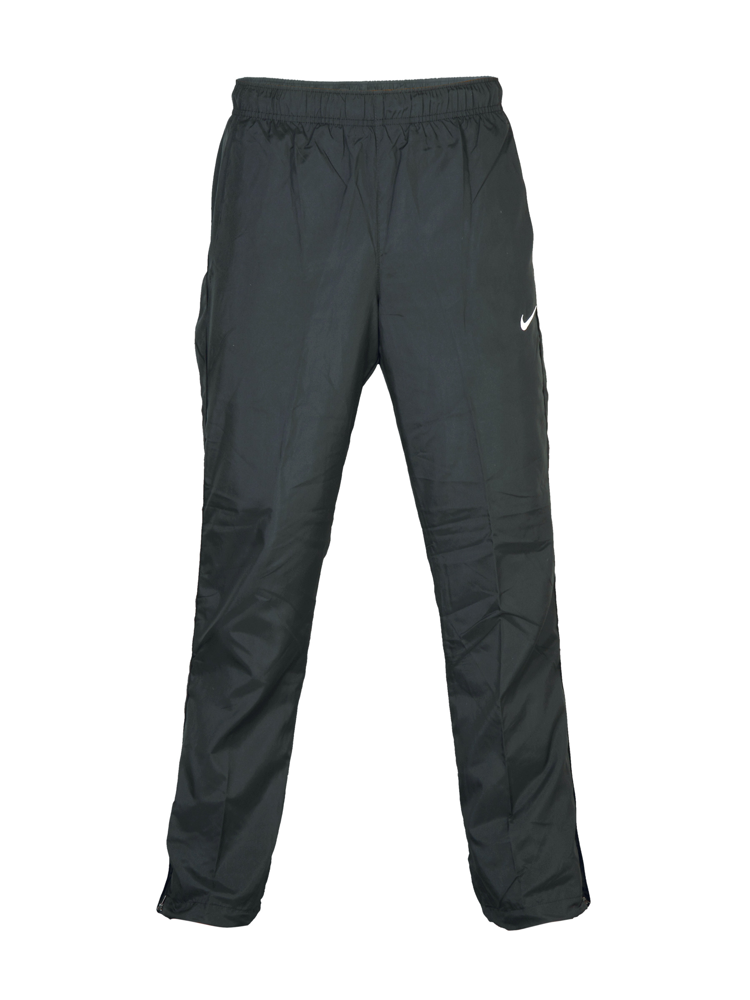

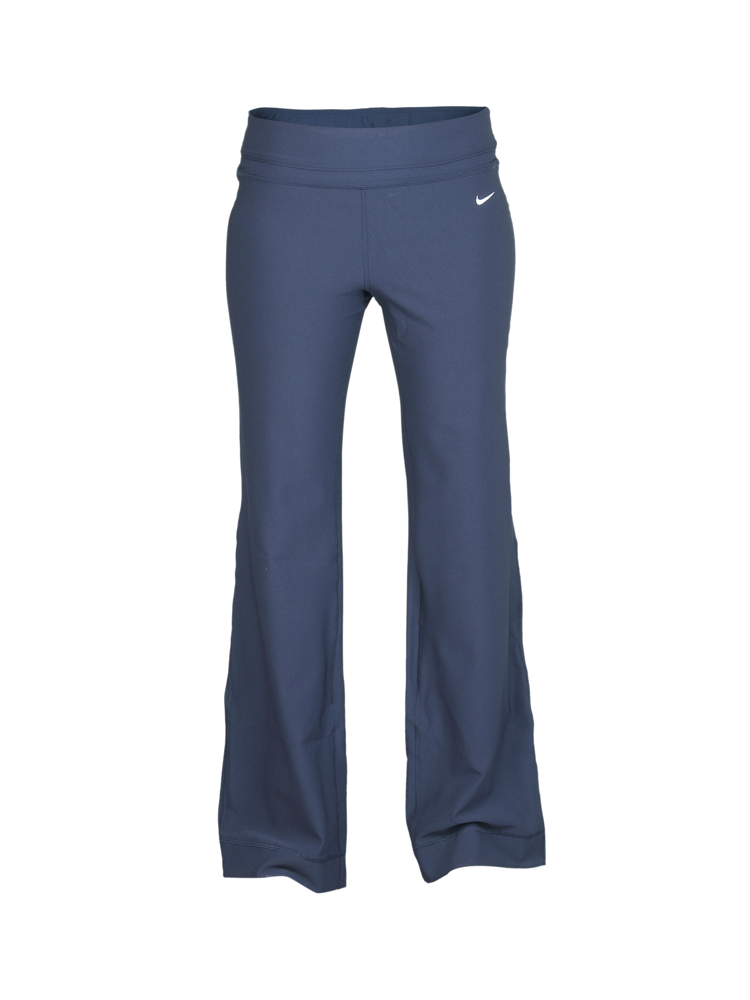

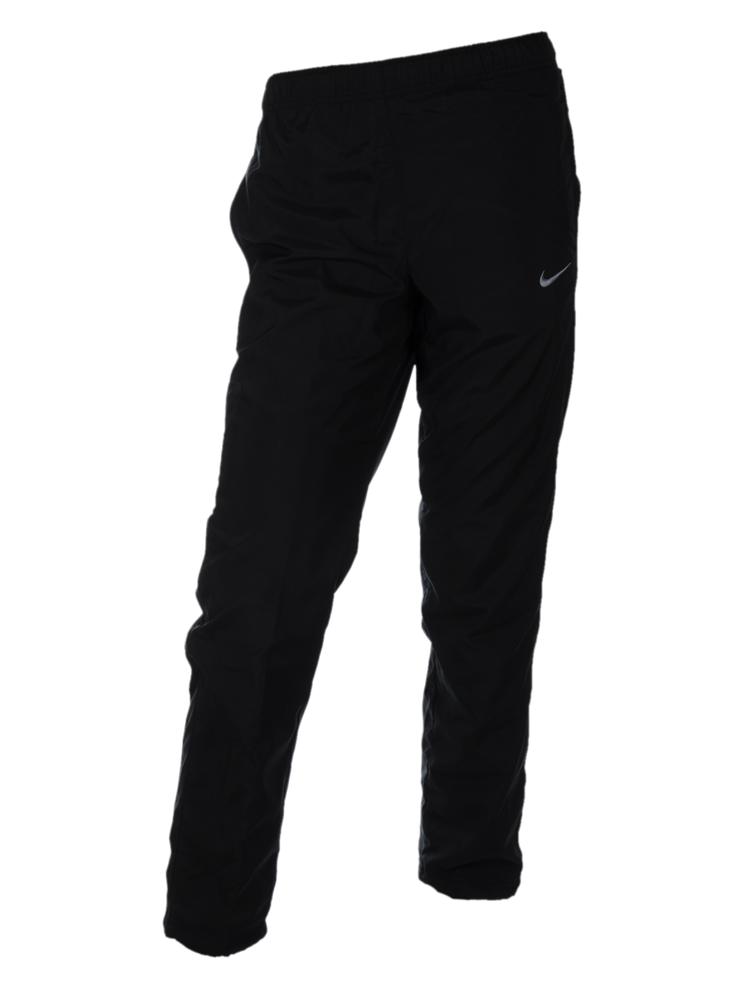

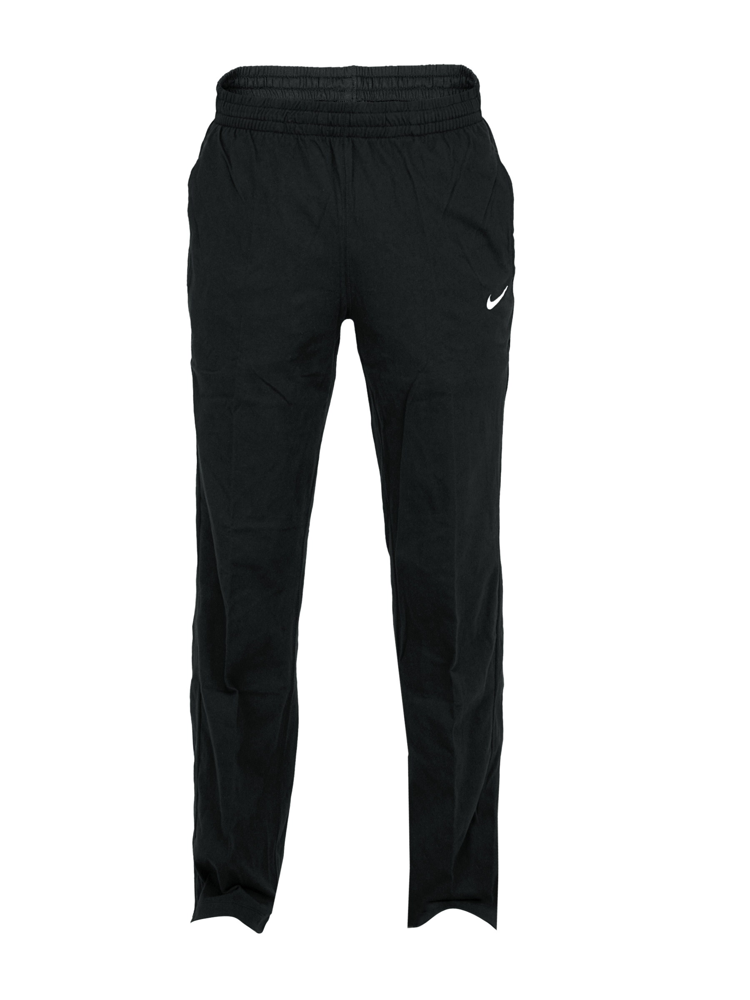

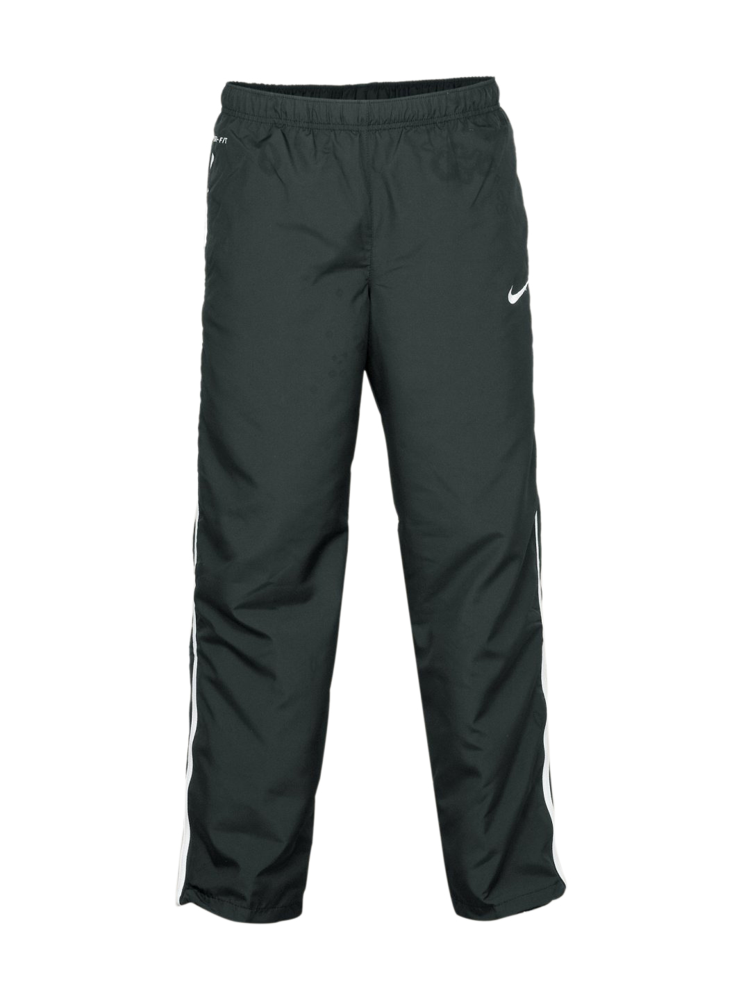

In [50]:
for i in indices[0]:
  temp_img = cv2.imread(filenames[i])
  cv2_imshow(temp_img)

## **MAIN CODE**

In [58]:
## Creating Function for recommendation system
def recommendation_item(imgPath):
  feature_list = np.array(pickle.load(open('embeddings.pkl','rb')))
  filenames = pickle.load(open('filenames.pkl','rb'))

  model = ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))
  model.trainable = False

  model = tensorflow.keras.Sequential([
    model,
    GlobalMaxPooling2D()
  ])

  img = image.load_img(imgPath, target_size=(224, 224))
  img_array = image.img_to_array(img)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)
  result = model.predict(preprocessed_img).flatten()
  normalized_result = result / norm(result)

  neighbors = NearestNeighbors(n_neighbors=6,algorithm='brute',metric='euclidean')
  neighbors.fit(feature_list)

  distances,indices = neighbors.kneighbors([normalized_result])

  for i in indices[0]:
    temp_img = cv2.imread(filenames[i])
    new_img = cv2.resize(temp_img, (500, 500)) 
    cv2_imshow(new_img)

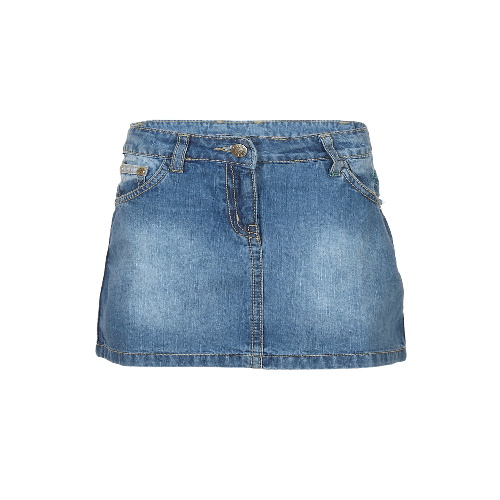

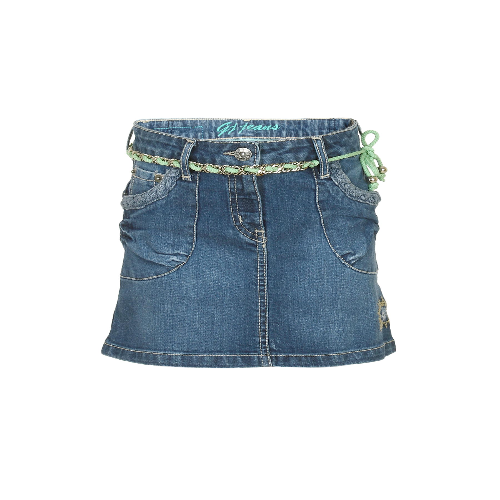

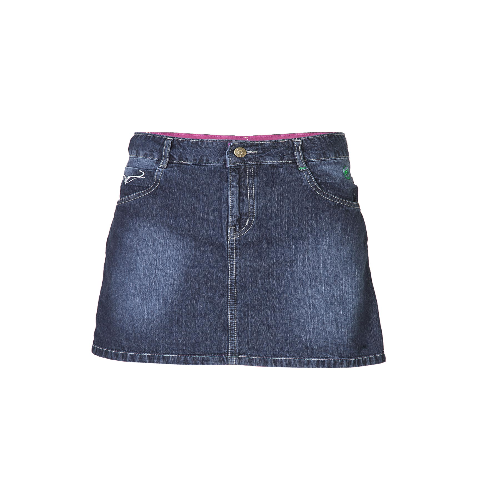

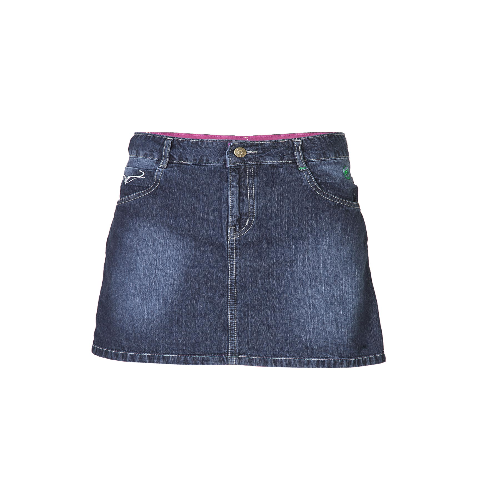

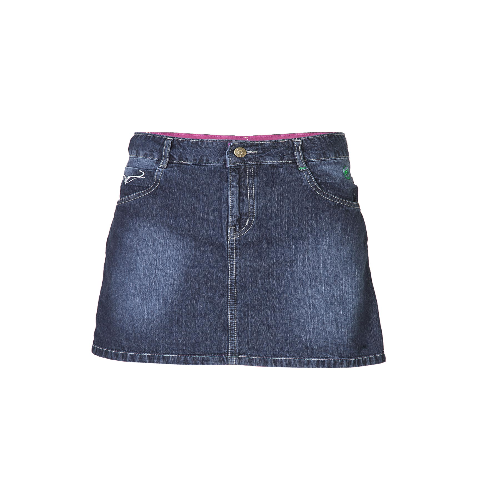

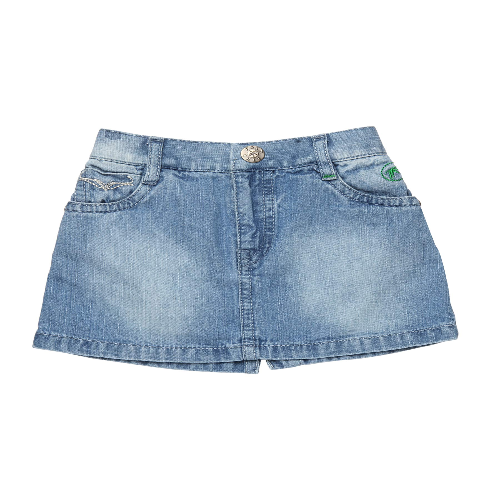

In [59]:
## TEST 1
## IMAGE OF SKIRT
recommendation_item('/content/fashion-dataset/fashion-dataset/images/10001.jpg')

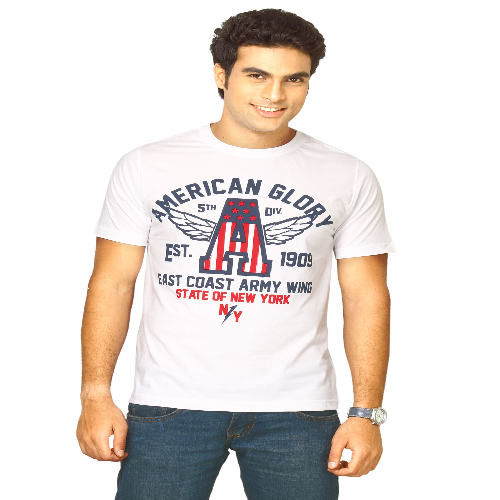

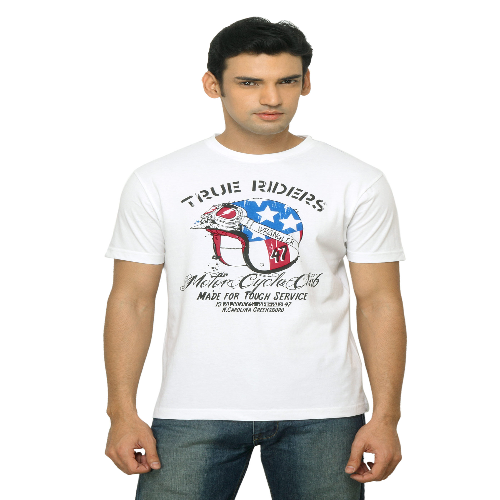

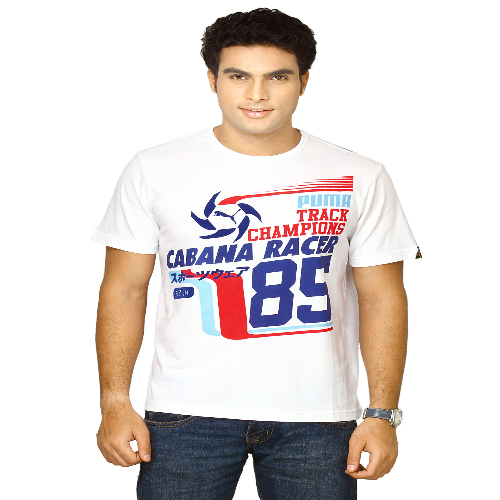

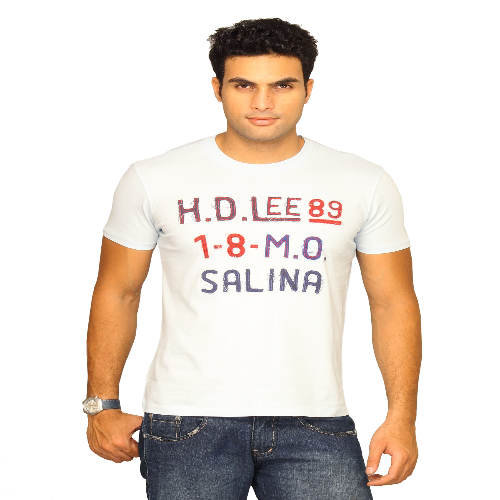

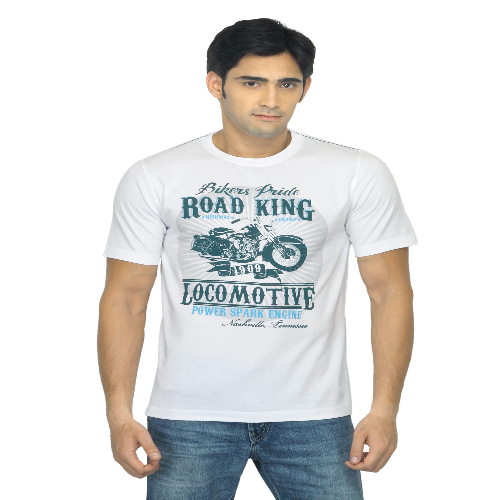

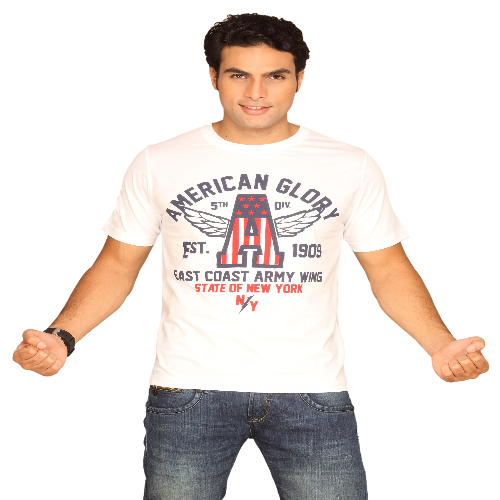

In [60]:
## TEST 2
## SHIRT IMAGE
recommendation_item('/content/fashion-dataset/fashion-dataset/images/10015.jpg')

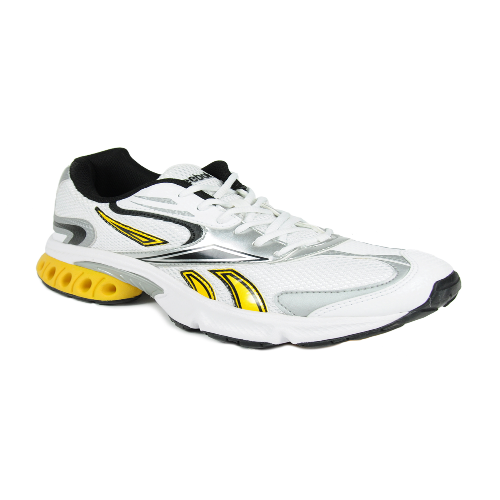

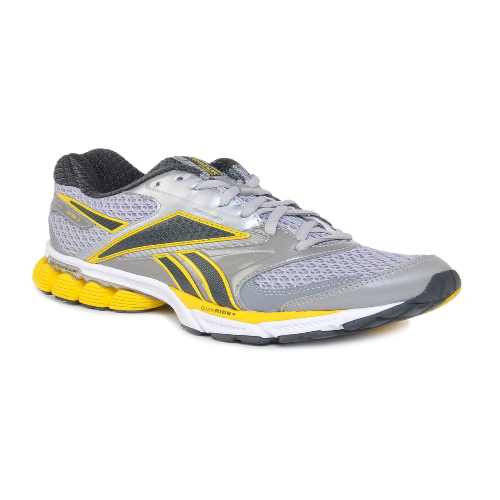

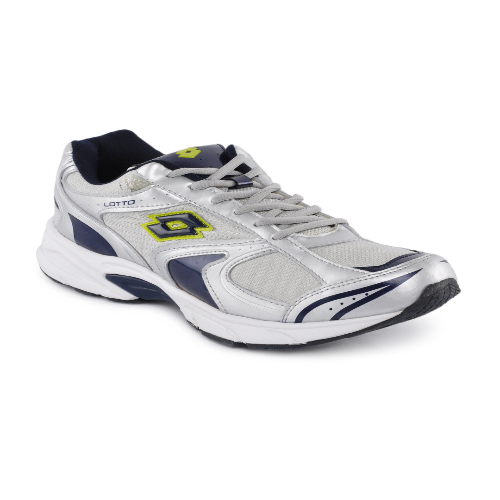

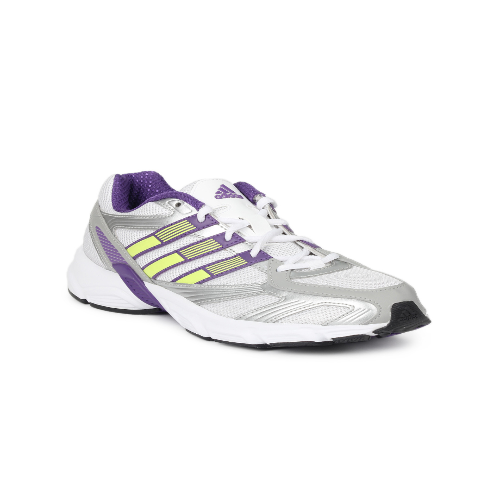

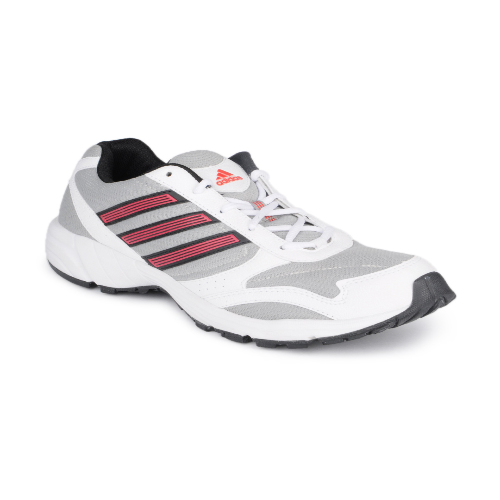

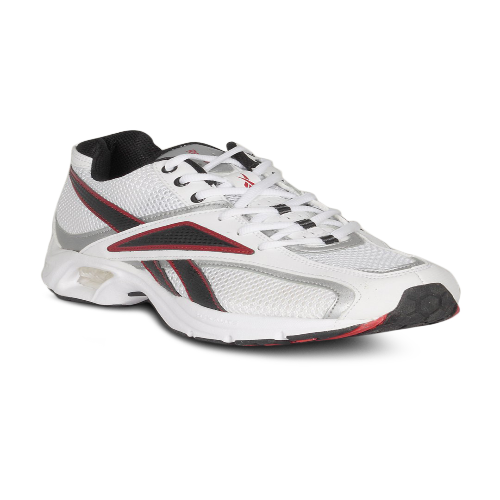

In [61]:
## TEST 3
## WHITE SHOES IMAGE
recommendation_item('/content/fashion-dataset/fashion-dataset/images/10122.jpg')

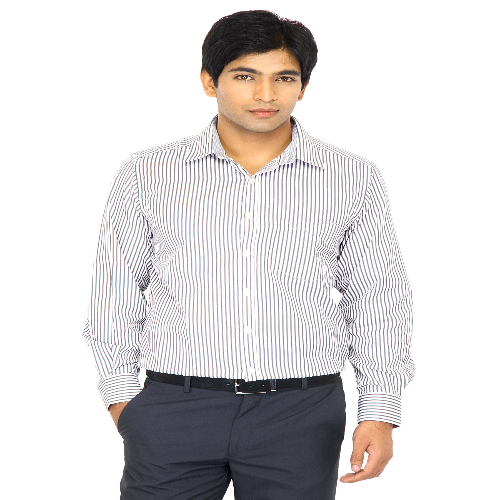

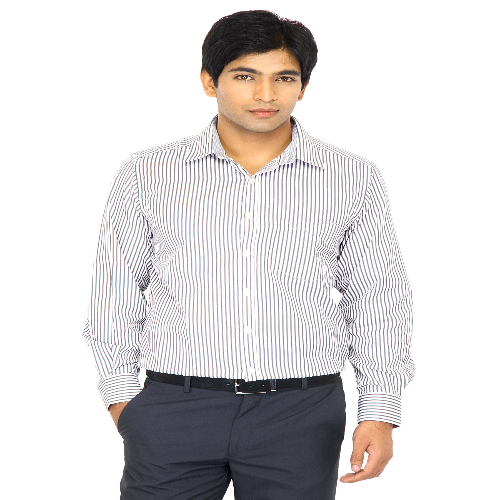

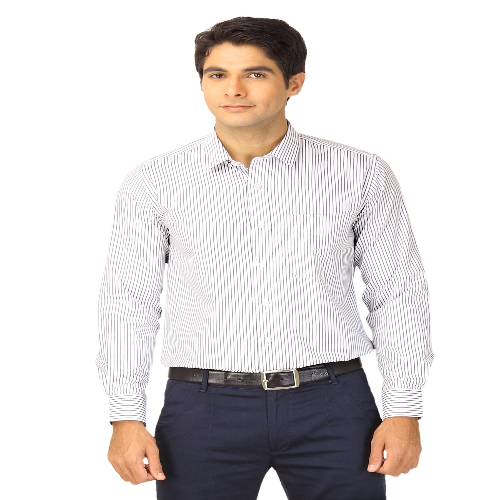

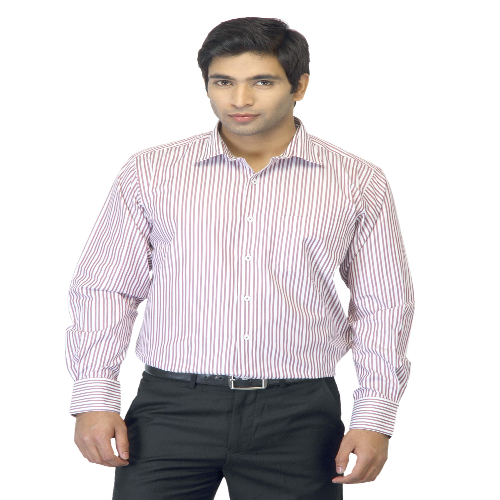

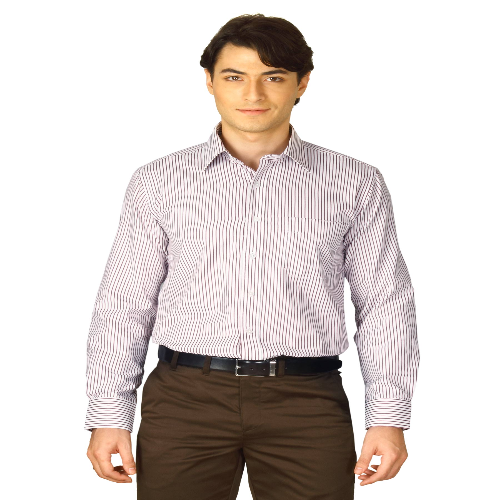

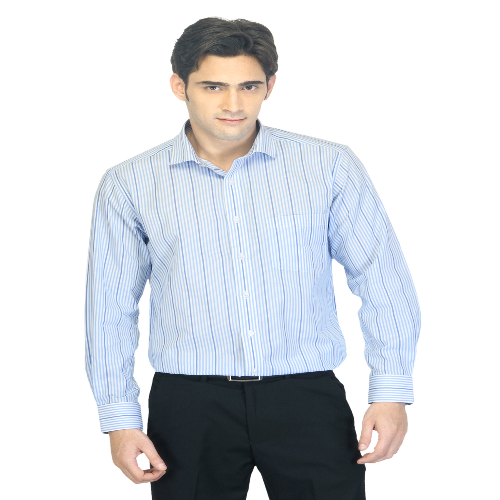

In [65]:
## TEST 4
## Formal Shirt IMAGE
recommendation_item('/content/fashion-dataset/fashion-dataset/images/11104.jpg')

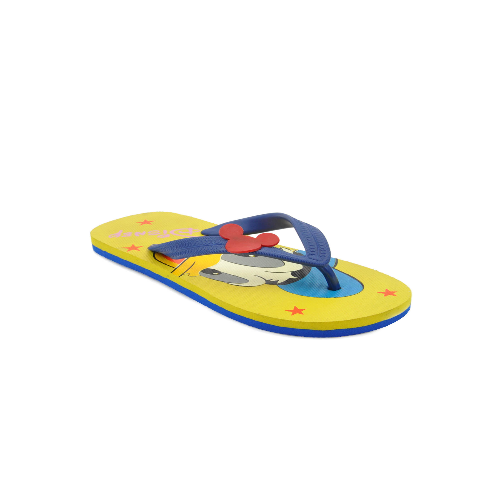

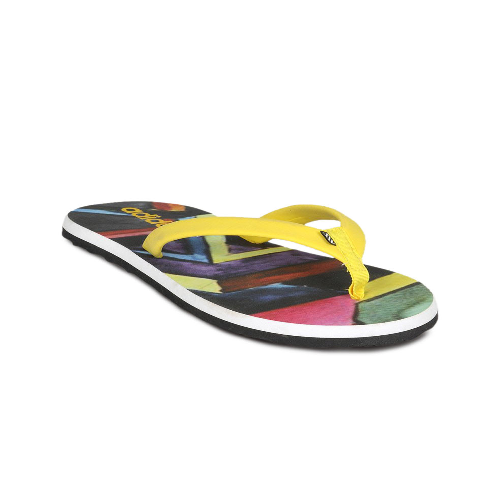

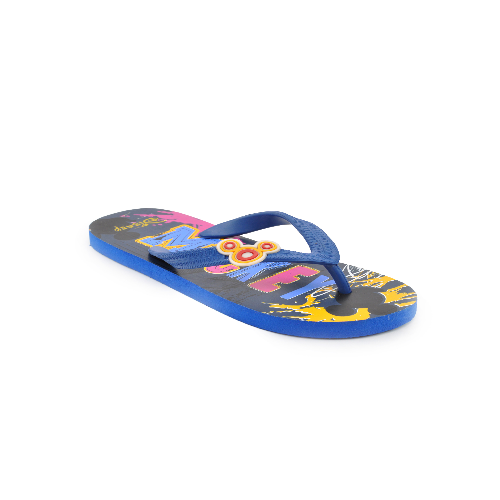

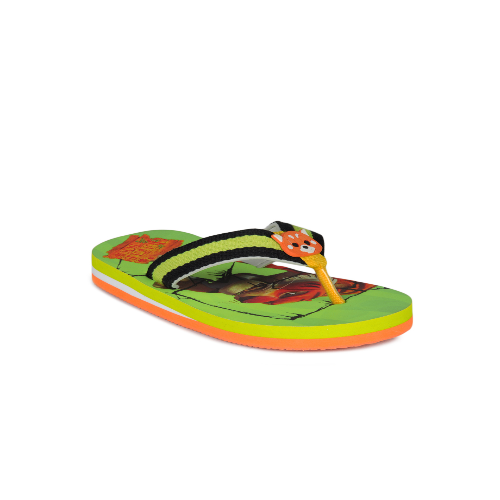

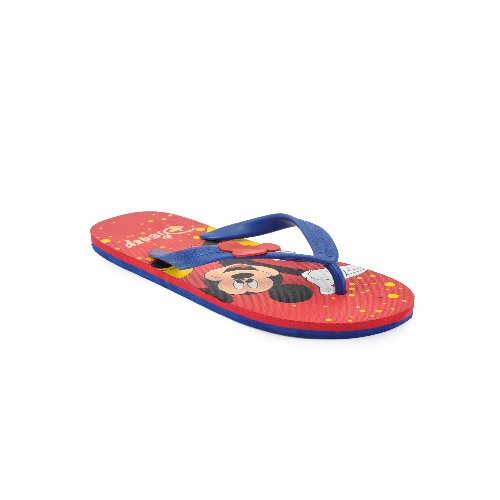

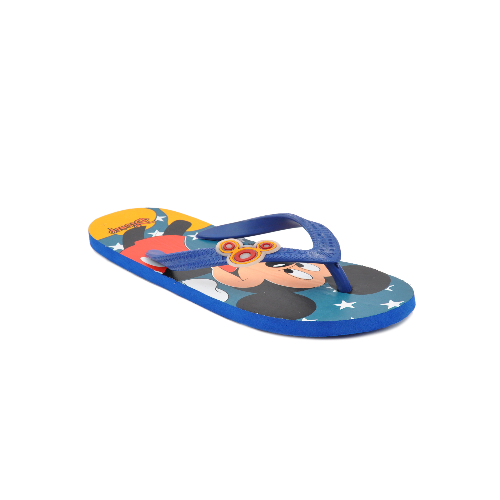

In [63]:
## TEST 5
## Slippers IMAGE
recommendation_item('/content/fashion-dataset/fashion-dataset/images/10762.jpg')

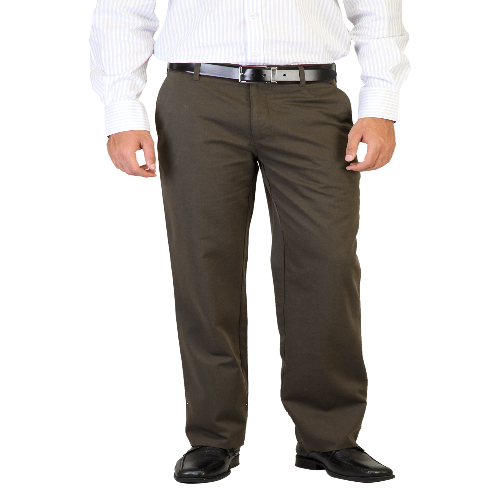

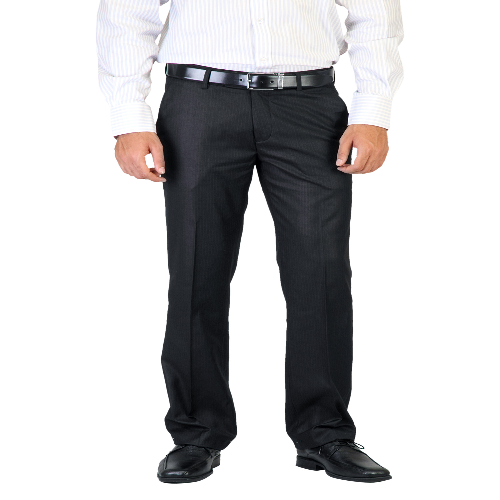

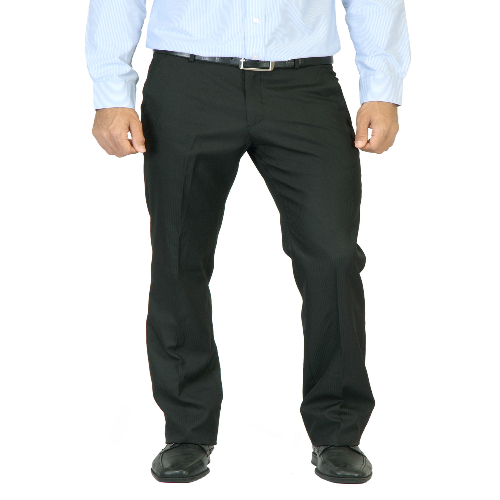

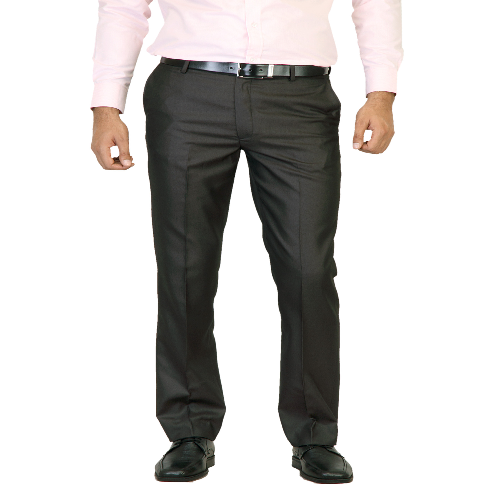

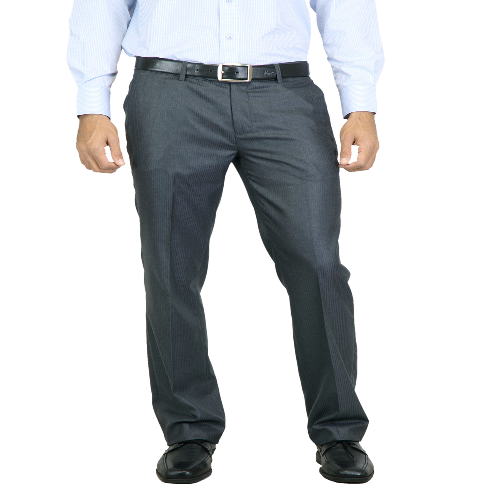

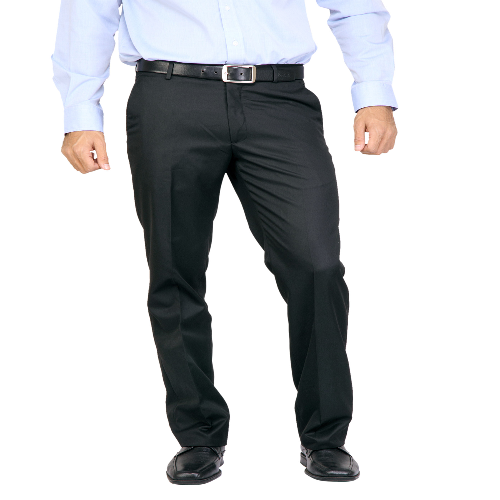

In [64]:
## TEST 6
## pants IMAGE
recommendation_item('/content/fashion-dataset/fashion-dataset/images/11253.jpg')